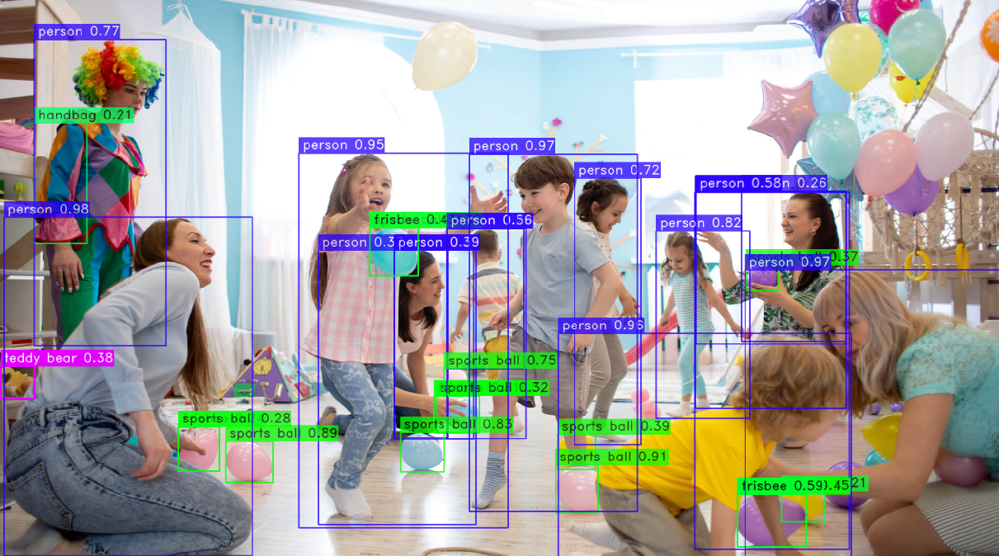

#### Computer Vision
- It is a field of study that enables computers to interpret and understand the visual world. It seeks to enable machines to gain a high-level understanding of images or videos, much like human vision.
- Some of the tasks performed by computer vision systems include image recognition, object detection, image segmentation, facial recognition, and more.

#### Objective
- In this project I will be covering 2 projects
- 1. YOLO models to detect objects by using different confidence levels
- 2. Building my own model using VGG 16 model

#### Part 1- YOLO
- "YOLO" stands for "You Only Look Once," and it's a real-time object detection system in images and videos in computer vision.
- YOLO (You Only Look Once) was introduced by Joseph Redmon and Santosh Divvala.
- The key idea behind YOLO is to divide the input image into a grid and predict bounding boxes and class probabilities for objects directly within that grid.
- One of the main advantages of YOLO is its real-time processing capability, which sets it apart from many traditional object detection algorithms.

In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [2]:
%cd /content/gdrive/MyDrive

/content/gdrive/MyDrive


#### YOLOv8
- It is the latest version in the YOLO series. It introduces a new transformer-based architecture, which results in improved accuracy and performance.
- YOLOv8 boasts an advanced training scheme with knowledge distillation and pseudo-labeling, making it a powerful object detection model.

In [3]:
import os
if not os.path.isdir("yolov8nas"):
  os.makedirs("yolov8nas")

In [4]:
%cd yolov8nas

/content/gdrive/MyDrive/yolov8nas


#### Super Gradients
- Super Gradients is a free, open-source pyTorch library used for classification, detection, segmention,post estimation,etc.
- Developed by Deci's deep learning experts for the benefit of the AI community.
- SuperGradients allows to train or fine-tune SOTA pre-trained models for all the most commonly applied computer vision tasks with just one training library.

In [5]:
!pip install super-gradients

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 95.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 48.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 84.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 86.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 36.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 69.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 79.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.0/68.0 kB 8.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to 

In [1]:
import super_gradients
from super_gradients.training import models

The console stream is logged into /root/sg_logs/console.log


[2023-12-07 09:50:42] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2023-12-07 09:50:42] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-12-07 09:50:42] INFO - utils.py - NumExpr defaulting to 2 threads.
[2023-12-07 09:50:52] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-12-07 09:50:52] WARNING - export.py - Failed to import pytorch_quantization
[2023-12-07 09:50:52] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization


In [3]:
!pip install torchinfo

#### YOLO-NAS


In [6]:
from torchinfo import summary

In [30]:
yolo_nas = super_gradients.training.models.get('yolo_nas_l', pretrained_weights="coco")

[2023-12-07 10:30:53] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2023-12-07 10:30:54] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


In [29]:
summary(model = yolo_nas, input_size=(16,3,640,640), col_names=["input_size", "output_size","num_params","trainable"],
        col_width=20, row_settings=["var_names"])

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
YoloNAS_L (YoloNAS_L)                                             [16, 3, 640, 640]    [16, 8400, 4]        --                   True
├─NStageBackbone (backbone)                                       [16, 3, 640, 640]    [16, 96, 160, 160]   --                   True
│    └─YoloNASStem (stem)                                         [16, 3, 640, 640]    [16, 48, 320, 320]   --                   True
│    │    └─QARepVGGBlock (conv)                                  [16, 3, 640, 640]    [16, 48, 320, 320]   3,024                True
│    └─YoloNASStage (stage1)                                      [16, 48, 320, 320]   [16, 96, 160, 160]   --                   True
│    │    └─QARepVGGBlock (downsample)                            [16, 48, 320, 320]   [16, 96, 160, 160]   88,128               True
│    │    └─YoloNASCSPLayer (blocks)                     

##### Case 1- Working with Confidence level percentage of 90%.

[2023-12-07 05:56:01] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


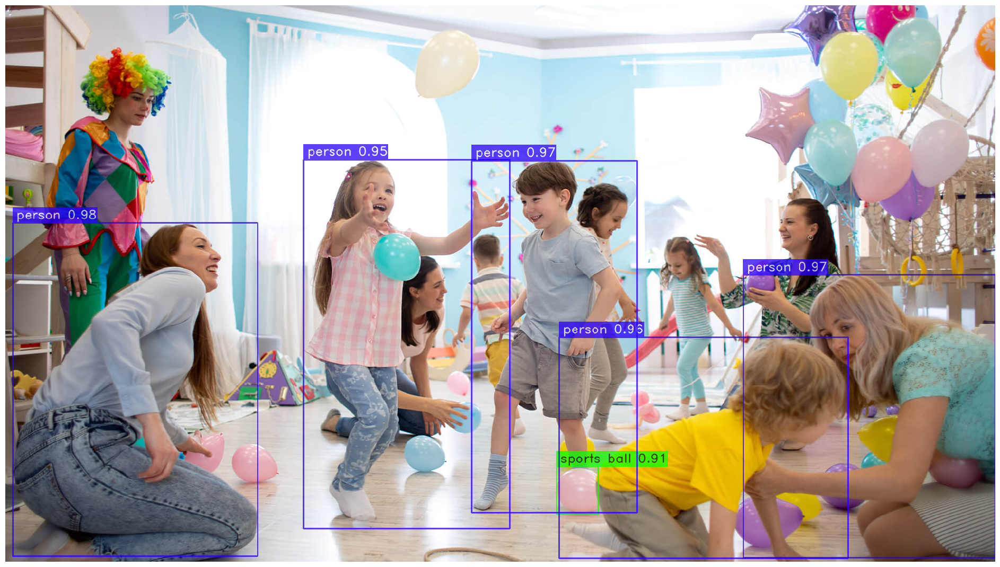

In [44]:
url = "/content/gdrive/MyDrive/yolov8nas/kids3.jpg"
yolo_nas.predict(url, conf=0.90).show()

##### Case 2- Working with Confidence level percentage of 20%


[2023-12-07 05:56:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


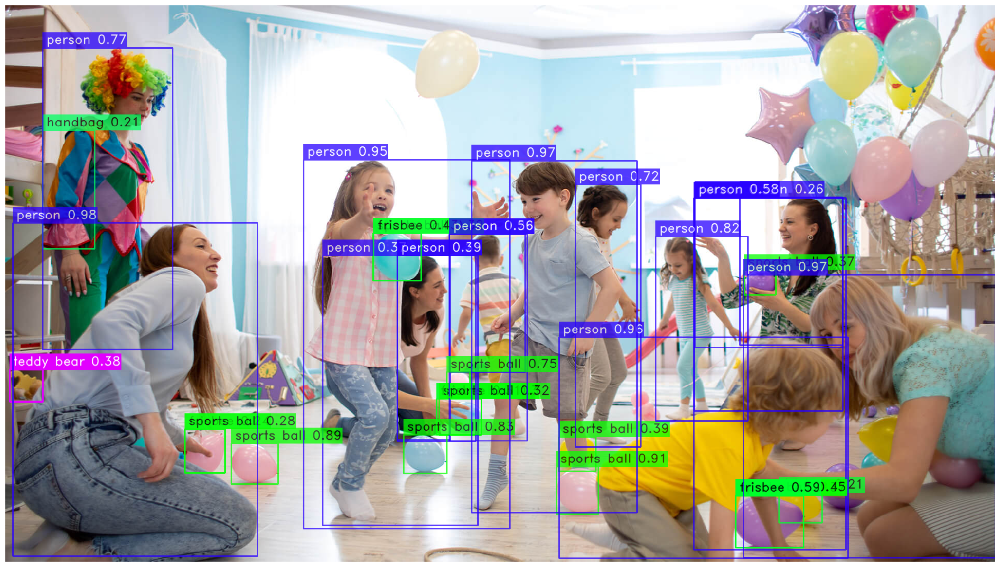

In [46]:
url = "/content/gdrive/MyDrive/yolov8nas/kids3.jpg"
yolo_nas.predict(url, conf=0.20).show()

#### YOLONAS-POSE

In [26]:
yolo_nas_pose = super_gradients.training.models.get("yolo_nas_pose_l", pretrained_weights="coco_pose")

[2023-12-07 10:27:18] INFO - checkpoint_utils.py - License Notification: YOLO-NAS-POSE pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS-POSE.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_pose_l_coco_pose.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_pose_l_coco_pose.pth
100%|██████████| 304M/304M [00:21<00:00, 14.9MB/s]
[2023-12-07 10:27:41] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_pose_l


##### Case 1- Working with Confidence level percentage of 85%

[2023-12-07 05:57:43] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


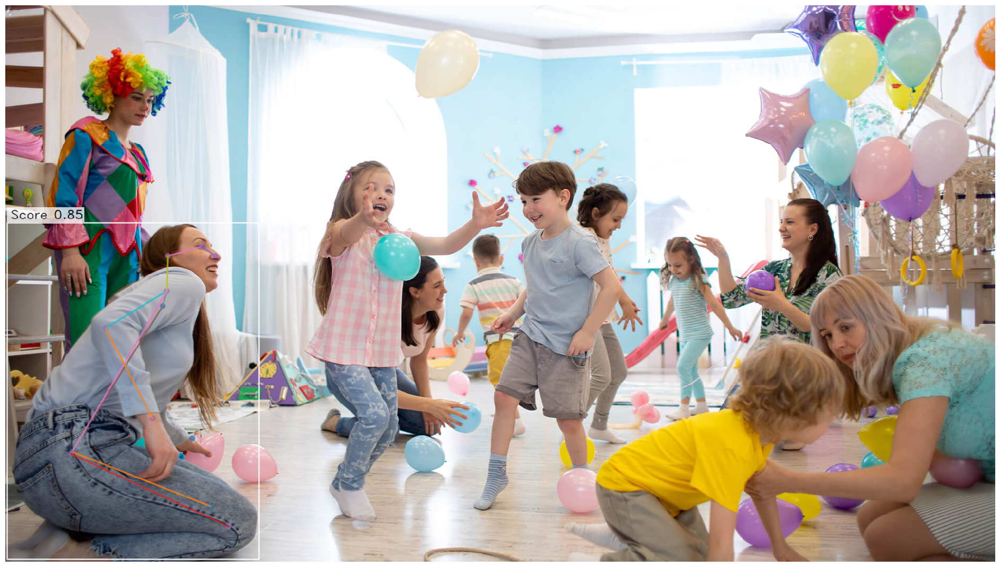

In [48]:
url = "/content/gdrive/MyDrive/yolov8nas/kids3.jpg"
yolo_nas_pose.predict(url, conf=0.85).show()

##### Case 2- Working with Confidence level percentage of 70%

[2023-12-07 06:00:28] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


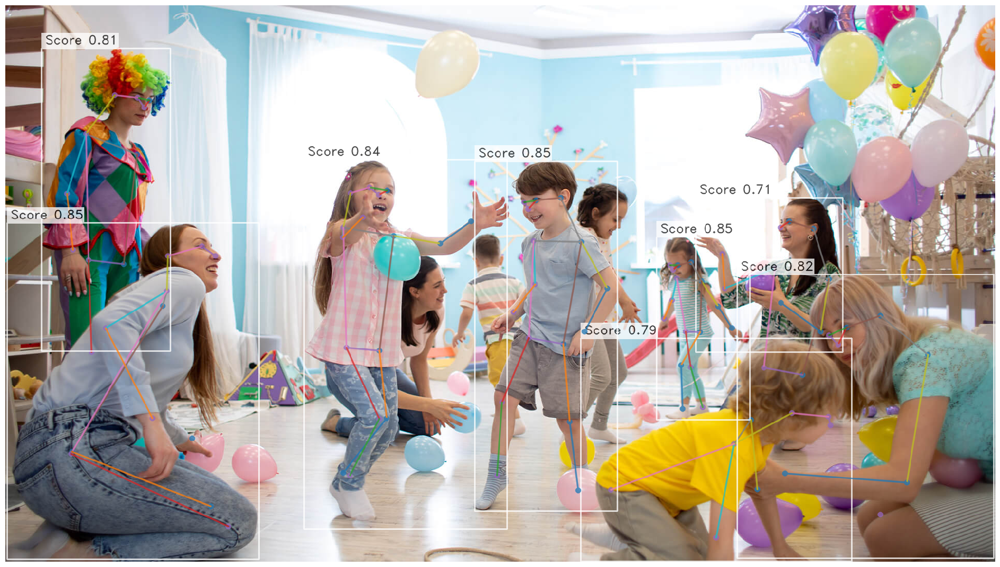

In [55]:
url = "/content/gdrive/MyDrive/yolov8nas/kids3.jpg"
yolo_nas_pose.predict(url, conf=0.70).show()

#### Part 2- Computer Vision with Deep Learning

In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [2]:
%cd /content/gdrive/MyDrive

/content/gdrive/MyDrive


In [3]:
import os
if not os.path.isdir("Opencv_DL"):
  os.makedirs("Opencv_DL")

In [4]:
%cd Opencv_DL

/content/gdrive/MyDrive/Opencv_DL


#### Importing required libraries

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow import keras

from keras import datasets, layers, models
from keras.layers import Input, Dense, Flatten, Lambda
from keras.models import Model, Sequential
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from glob import glob
from keras.preprocessing.image import ImageDataGenerator

In [25]:
Image_size = [224,224]
train_path = "/content/gdrive/MyDrive/Opencv_DL/Train"
test_path = "/content/gdrive/MyDrive/Opencv_DL/Test"

#### VGG 16
- It was proposed by Karen Simonyan and Andrew Zisserman of the Visual Geometry Group Lab of Oxford University in 2014. It is a convolutional neural network that is 16 layers deep.

In [26]:
vgg = VGG16(input_shape=Image_size + [3], weights= "imagenet", include_top=False)
for layer in vgg.layers:
  layer.trainable = False

In [27]:
folders = glob("/content/gdrive/MyDrive/Opencv_DL/Train/*")
folders

['/content/gdrive/MyDrive/Opencv_DL/Train/c',
 '/content/gdrive/MyDrive/Opencv_DL/Train/b',
 '/content/gdrive/MyDrive/Opencv_DL/Train/a',
 '/content/gdrive/MyDrive/Opencv_DL/Train/e',
 '/content/gdrive/MyDrive/Opencv_DL/Train/d']

In [28]:
x = Flatten()(vgg.output)
prediction = Dense(len(folders), activation='softmax')(x)
model = Model(inputs=vgg.input, outputs=prediction)
model.summary()


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [29]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics = ['accuracy'])

In [30]:
train_datagen = ImageDataGenerator(rescale = 1./255, shear_range=0.2, zoom_range=0.2,
                                   horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale = 1./255)

In [31]:
training_set = train_datagen.flow_from_directory("/content/gdrive/MyDrive/Opencv_DL/Train",
                                                 target_size=(224,224), batch_size=32,
                                                 class_mode="categorical")

test_set = test_datagen.flow_from_directory("/content/gdrive/MyDrive/Opencv_DL/Test",
                                                 target_size=(224,224), batch_size=32,
                                                 class_mode="categorical")

Found 25 images belonging to 5 classes.
Found 5 images belonging to 5 classes.


In [32]:
final_model = model.fit_generator(training_set, validation_data=test_set, epochs=10,
                                  steps_per_epoch=len(training_set), validation_steps=len(test_set))

<ipython-input-32-bbc1c89af96f>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  final_model = model.fit_generator(training_set, validation_data=test_set, epochs=10,


Epoch 1/10
1/1 [==============================] - 21s 21s/step - loss: 1.9662 - accuracy: 0.2000 - val_loss: 2.2208 - val_accuracy: 0.4000
Epoch 2/10
1/1 [==============================] - 20s 20s/step - loss: 2.1018 - accuracy: 0.4400 - val_loss: 2.3224 - val_accuracy: 0.4000
Epoch 3/10
1/1 [==============================] - 22s 22s/step - loss: 1.9350 - accuracy: 0.5600 - val_loss: 1.8815 - val_accuracy: 0.6000
Epoch 4/10
1/1 [==============================] - 20s 20s/step - loss: 1.3501 - accuracy: 0.7200 - val_loss: 1.4914 - val_accuracy: 0.4000
Epoch 5/10
1/1 [==============================] - 20s 20s/step - loss: 0.7700 - accuracy: 0.8000 - val_loss: 1.1497 - val_accuracy: 0.6000
Epoch 6/10
1/1 [==============================] - 22s 22s/step - loss: 0.3867 - accuracy: 0.9600 - val_loss: 1.6654 - val_accuracy: 0.2000
Epoch 7/10
1/1 [==============================] - 20s 20s/step - loss: 0.6623 - accuracy: 0.6800 - val_loss: 1.6294 - val_accuracy: 0.4000
Epoch 8/10
1/1 [===========

In [ ]:
from keras.models import load_model
model.save("my_own_model_cv.h5")

#### Conclusion
- In this project  tried to acheive two objectives
  - One to use YOLo Nas & Yolo Nas Pose models for object detection using different confidence levels.
  - Second was to build my own model using VGG16 model.
- Data for both projects was taken randomly. The purpose was not to get high accuracy as the dataset had less than 40 images